In [2]:
!nvidia-smi

Thu Dec  3 05:34:27 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.38       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   54C    P8    10W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# **Module 2 (Fashion Objects localiztion)**
In this module we use object detection techniques to localizalize fashion objects in the images 

Get Data

In [4]:
#get data from aws s3 bucket
#!wget https://s3-eu-west-1.amazonaws.com/valohai-examples/deep-fashion-detection/category-and-attribute-prediction-benchmark-v1.1.zip
# !unzip -q '/content/category-and-attribute-prediction-benchmark-v1.1.zip' -d '/content/'
# !unzip -q '/content/data/Img/img.zip' -d /content/data/Img
# !rm '/content/data/Img/img.zip'
# !rm '/content/category-and-attribute-prediction-benchmark-v1.1.zip'

#I have data saved on gdrive so directly copy 
!cp '/content/drive/MyDrive/AAIC/CS2/data/data_final.zip' '/content/'
!unzip -q '/content/data_final.zip' -d '/content/myntra'
!mv '/content/myntra/content/data' '/content/'

!rm -rf '/content/myntra'
!cp '/content/drive/MyDrive/AAIC/CS2/data/label_map.pbtxt' '/content/data'

In [1]:
import pandas as pd
df = pd.read_csv('/content/drive/MyDrive/AAIC/CS2/full/final_anotation.csv')#same file can be found in aws s3 downloaded folder 

In [2]:
df = df.drop('Unnamed: 0',axis=1)
df.columns =['image_name', 'category_name', 'category_type', 'xmin', 'ymin', 'xmax',
       'ymax']
df.head()

,image_name,category_name,category_type,xmin,ymin,xmax,ymax
0,img/Sheer_Pleated-Front_Blouse/img_00000001.jpg,upper_ware,1,72,79,232,273
1,img/Sheer_Pleated-Front_Blouse/img_00000002.jpg,upper_ware,1,67,59,155,161
2,img/Sheer_Pleated-Front_Blouse/img_00000003.jpg,upper_ware,1,65,65,156,200
3,img/Sheer_Pleated-Front_Blouse/img_00000004.jpg,upper_ware,1,51,62,167,182
4,img/Sheer_Pleated-Front_Blouse/img_00000005.jpg,upper_ware,1,46,88,166,262


In [3]:
df.isnull().sum()

image_name       0
category_name    0
category_type    0
xmin             0
ymin             0
xmax             0
ymax             0
dtype: int64

Train model using Tesnsorflow API 2.0

I used lot of source code from their offical documentation
https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/index.html

In [14]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models.git

!pip install cloud-annotations==0.0.4
!pip install tf_slim
!pip install lvis
!pip install --no-deps tensorflowjs==1.4.0

%cd /content/models/research
!protoc object_detection/protos/*.proto --python_out=.

pwd = os.getcwd()
os.environ['PYTHONPATH'] += f':{pwd}:{pwd}/slim'
!cp -r '/content/models/official' '/content/models/research/object_detection/builders'
!cp -r '/content/models/official' '/content/models/research'

Cloning into 'models'...
remote: Enumerating objects: 2318, done.
remote: Counting objects: 100% (2318/2318), done.
remote: Compressing objects: 100% (2016/2016), done.
remote: Total 2318 (delta 564), reused 925 (delta 278), pack-reused 0
Receiving objects: 100% (2318/2318), 30.64 MiB | 33.49 MiB/s, done.
Resolving deltas: 100% (564/564), done.
/content/models/research


In [25]:
#Data split
from sklearn.model_selection import train_test_split
X_train,X_test = train_test_split(df,shuffle=False)
X_train.shape,X_test.shape

((221604, 7), (73868, 7))

In [28]:
aNUM_TRAIN_STEPS = 500

MODEL_TYPE = 'ssd_mobilenet_v1_quantized_300x300_coco14_sync_2018_07_18'
CONFIG_TYPE = 'ssd_mobilenet_v1_quantized_300x300_coco14_sync'


CHECKPOINT_PATH = '/content/checkpoint'
OUTPUT_PATH     = '/content/output'
EXPORTED_PATH   = '/content/exported'
DATA_PATH       = '/content/data'

LABEL_MAP_PATH    = os.path.join(DATA_PATH, 'label_map.pbtxt')
TRAIN_RECORD_PATH = os.path.join(DATA_PATH, 'train.record')
VAL_RECORD_PATH   = os.path.join(DATA_PATH, 'val.record')

In [29]:
import os
import glob
import pandas as pd
import io
import xml.etree.ElementTree as ET
import argparse

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'    # Suppress TensorFlow logging (1)
import tensorflow.compat.v1 as tf
from PIL import Image
from object_detection.utils import dataset_util, label_map_util
from collections import namedtuple

def split(df, group):
    data = namedtuple('data', ['filename', 'object'])
    gb = df.groupby(group)
    return [data(filename, gb.get_group(x)) for filename, x in zip(gb.groups.keys(), gb.groups)]

def create_tf_example(group, path):
    with tf.gfile.GFile(os.path.join(path, '{}'.format(group.filename)), 'rb') as fid:
        encoded_jpg = fid.read()
    encoded_jpg_io = io.BytesIO(encoded_jpg)
    image = Image.open(encoded_jpg_io)
    width, height = image.size

    filename = group.filename.encode('utf8')
    image_format = b'jpg'
    xmins = []
    xmaxs = []
    ymins = []
    ymaxs = []
    classes_text = []
    classes = []

    for index, row in group.object.iterrows():
        xmins.append(row['xmin']/width)
        xmaxs.append(row['xmax']/width)
        ymins.append(row['ymin']/height)
        ymaxs.append(row['ymax']/height)
        classes_text.append(row['category_name'].encode('utf8'))
        classes.append(row['category_type'])

    tf_example = tf.train.Example(features=tf.train.Features(feature={
        'image/height': dataset_util.int64_feature(height),
        'image/width': dataset_util.int64_feature(width),
        'image/filename': dataset_util.bytes_feature(filename),
        'image/source_id': dataset_util.bytes_feature(filename),
        'image/encoded': dataset_util.bytes_feature(encoded_jpg),
        'image/format': dataset_util.bytes_feature(image_format),
        'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
        'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
        'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
        'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
        'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
        'image/object/class/label': dataset_util.int64_list_feature(classes),
    }))
    return tf_example

In [ ]:
#generate tf record file for training 
path = '/content/data/Img/'
writer = tf.python_io.TFRecordWriter(TRAIN_RECORD_PATH)
grouped = split(X_train, 'image_name')
c=0
for group in grouped:
    tf_example = create_tf_example(group, path)
    writer.write(tf_example.SerializeToString())
    if c%10000==0:
      print(c)
    c+=1
writer.close()

In [31]:
##generate tf record file for testing 
path = '/content/data/Img/'
writer = tf.python_io.TFRecordWriter(VAL_RECORD_PATH)
grouped = split(X_test, 'image_name')
c=0
for group in grouped:
    tf_example = create_tf_example(group, path)
    writer.write(tf_example.SerializeToString())
    if c%10000==0:
      print(c)
    c+=1
writer.close()

0
10000
20000
30000
40000
50000
60000


In [ ]:
%cd /content/

In [33]:
#Download the pre-train model
#link https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d3_coco17_tpu-32.tar.gz

--2020-12-03 06:25:31--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d3_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.253.63.128, 2607:f8b0:4004:c08::80
Connecting to download.tensorflow.org (download.tensorflow.org)|172.253.63.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 92858658 (89M) [application/x-tar]
Saving to: ‘efficientdet_d3_coco17_tpu-32.tar.gz’

efficientdet_d3_coc 100%[===================>]  88.56M  68.3MB/s    in 1.3s    

2020-12-03 06:25:33 (68.3 MB/s) - ‘efficientdet_d3_coco17_tpu-32.tar.gz’ saved [92858658/92858658]



In [4]:
#setting up directory structure for training model
!mkdir training_demo

!mkdir training_demo/pre-trained-models
#change file name according to model
!tar -xf '/content/efficientdet_d3_coco17_tpu-32.tar.gz' -C '/content/training_demo/pre-trained-models'
!mkdir training_demo/model
%cd /content/training_demo
!cp '/content/training_demo/pre-trained-models/efficientdet_d3_coco17_tpu-32/pipeline.config' '/content/training_demo/model'
!cp '/content/models/research/object_detection/model_main_tf2.py' '/content/training_demo'
!cp -r '/content/models/official' '/content/models/research'
!rm -rf '/content/training_demo/pre-trained-models/efficientdet_d3_coco17_tpu-32'

In [38]:
%reload_ext tensorboard
%tensorboard --logdir=/content/training_demo/model/train

<IPython.core.display.Javascript object>

In [ ]:
#please modify pipeline.config according to model and documentation in the link
!python model_main_tf2.py --model_dir=/content/training_demo/model --pipeline_config_path=/content/training_demo/model/pipeline.config 

In [ ]:
#loss for efficientdet model

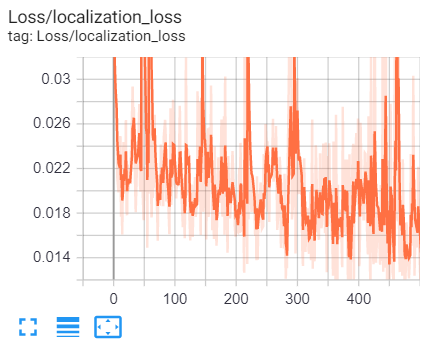

In [19]:
!cp '/content/models/research/object_detection/exporter_main_v2.py' '/content/training_demo'

In [20]:
!mkdir /content/training_demo/export_model
!mkdir /content/training_demo/model/check

In [21]:
!cp '/content/training_demo/model/pipeline.config' '/content/training_demo/model/check'
!cp '/content/training_demo/model/checkpoint' '/content/training_demo/model/check'
!cp '/content/training_demo/model/ckpt-2.data-00000-of-00001' '/content/training_demo/model/check'
!cp '/content/training_demo/model/ckpt-2.index' '/content/training_demo/model/check'


In [ ]:
#exporting the trained model
!python exporter_main_v2.py --input_type image_tensor --pipeline_config_path /content/training_demo/model/pipeline.config --trained_checkpoint_dir /content/training_demo/model/check --output_directory /content/training_demo/export_model

Test the above trained model

In [23]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'    # Suppress TensorFlow logging (1)
import pathlib
import tensorflow as tf

tf.get_logger().setLevel('ERROR')           # Suppress TensorFlow logging (2)

# Enable GPU dynamic memory allocation
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

In [29]:
PATH_TO_MODEL_DIR = '/content/training_demo/export_model'
PATH_TO_LABELS = '/content/data/label_map.pbtxt'

In [25]:
%cd /content/models/research

/content/models/research


In [26]:
import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + "/saved_model"

print('Loading model...', end='')
start_time = time.time()

# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

Loading model...Done! Took 35.54260230064392 seconds


In [39]:
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)

In [40]:
#sample test images
IMAGE_PATHS = [ 'image8_3.jpg',
 'image7_4.jpg',
 'image4_3.jpg',
 'image3_3.jpg',
 'image10_1.jpg']

Running inference for image8_3.jpg... 

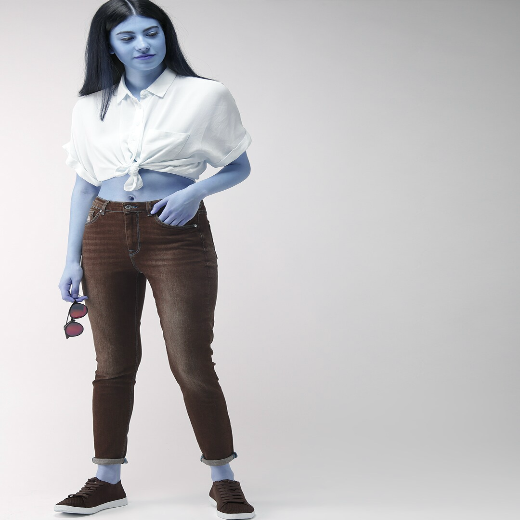

Done
Running inference for image7_4.jpg... 

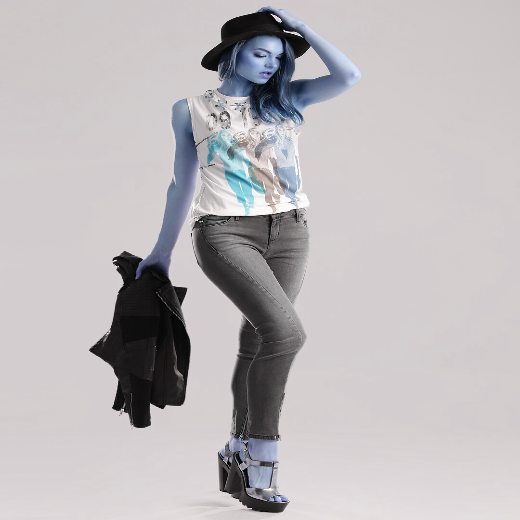

Done
Running inference for image4_3.jpg... 

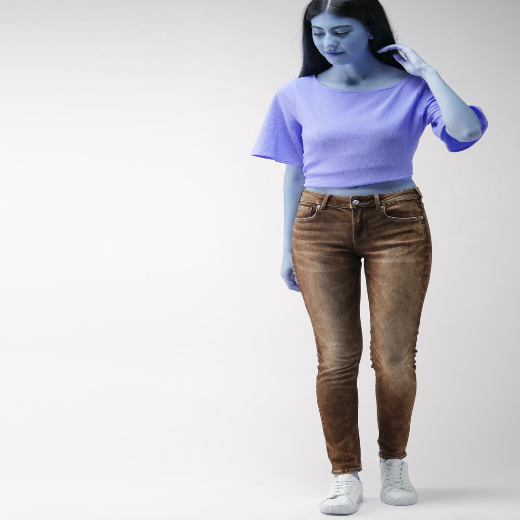

Done
Running inference for image3_3.jpg... 

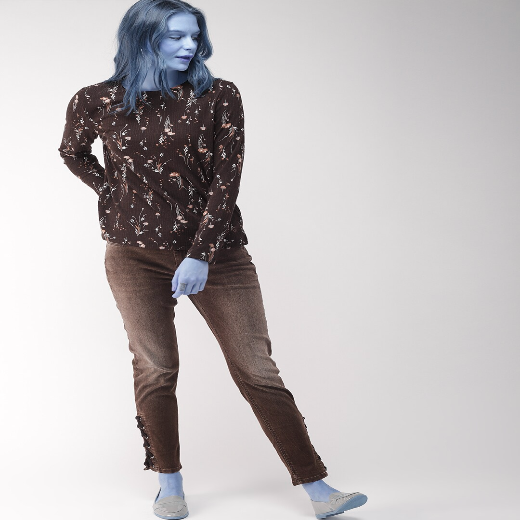

Done
Running inference for image10_1.jpg... 

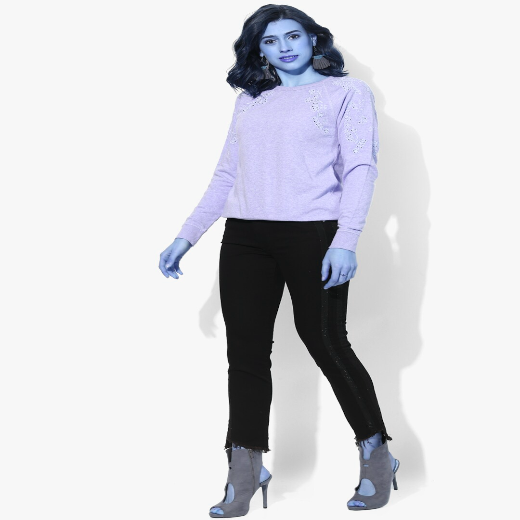

Done


In [51]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
import cv2
from google.colab.patches import cv2_imshow
#warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
      path: the file path to the image

    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)

    """
    img = cv2.imread('/content/' + path,cv2.IMREAD_UNCHANGED)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    img = cv2.resize(img,(520,520))
    return img


for image_path in IMAGE_PATHS:

    print('Running inference for {}... '.format(image_path), end='')

    image_np = load_image_into_numpy_array(image_path)

    # Things to try:
    # Flip horizontally
    # image_np = np.fliplr(image_np).copy()

    # Convert image to grayscale
    #image_np = np.tile(
    #     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image_np)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]

    # input_tensor = np.expand_dims(image_np, 0)
    detections = detect_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                   for key, value in detections.items()}
    detections['num_detections'] = num_detections

    # detection_classes should be ints.
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=6,
          min_score_thresh=0,
          agnostic_mode=False)


    cv2_imshow(image_np_with_detections)
    print('Done')

In [ ]:
#Result of YOLO V3

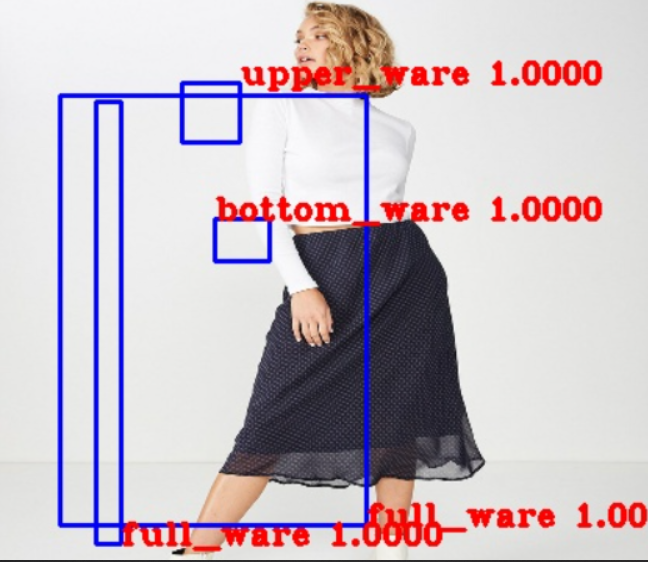

In [ ]:
# Results of Faster R-CNN ResNet50 V1 640x640

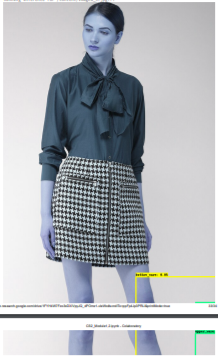

In [ ]:
"""
So I have trained models using Tensorflow object detection api 2.0. For doing this I have refferd following site
https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/
I trained models like 
1:CenterNet HourGlass104 512x512
2:EfficientDet D0 512x512
3:Faster R-CNN ResNet50 V1 640x640
4:YOLO V3
"""

"""
Training details:
Step 1:
First  I fine tuned trained models using Deep Fashion database it has bounding boxes for (Upper_ware, Lower_ware and full_ware)
this data set has almost 200000 labelled box images
Link to dataset:
https://s3-eu-west-1.amazonaws.com/valohai-examples/deep-fashion-detection/category-and-attribute-prediction-benchmark-v1.1.zip

Step 2:
I fined tuned the above model on my custom dataset which I had scraped from myntra. This dataset had bounding boxes for 
(upper_ware,lower ware and foot_ware) It had almost 2k labelled images

Observation:
As my fine tunnig dataset was very small and above dataset had only 1  object per image. So the above model didn't perform well
when there were multiple objects. MAP for model was also very low. So I couldn't use this model.

"""

In [ ]:
"""
As the above approach didn't work. From bounding box I went for a masking approach. I have used Mask-RCNN model.
I have used iMaterialist (Fashion) dataset. Details of this dataset can be found on Kaggle

Link: https://www.kaggle.com/c/imaterialist-fashion-2019-FGVC6/data

For training I have refered the kernel: https://www.kaggle.com/pednoi/training-mask-r-cnn-to-be-a-fashionista-lb-0-07
"""

##MASK RCNN model for training

In [ ]:
# Download data from kaggle iMaterialist (Fashion) 2019 at FGVC6.
# https://www.kaggle.com/c/imaterialist-fashion-2019-FGVC6/data

In [ ]:
import os
import gc
import sys
import json
import glob
import random
from pathlib import Path

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import itertools
from tqdm import tqdm

from imgaug import augmenters as iaa
from sklearn.model_selection import StratifiedKFold, KFold

In [ ]:
DATA_DIR = Path('/kaggle/input')
ROOT_DIR = Path('/kaggle/working')

# For demonstration purpose, the classification ignores attributes (only categories),
# and the image size is set to 512, which is the same as the size of submission masks
NUM_CATS = 46
IMAGE_SIZE = 512

Dowload Libraries and Pretrained Weights for Mask RCNN model

In [ ]:
!git clone https://www.github.com/matterport/Mask_RCNN.git
os.chdir('Mask_RCNN')

!rm -rf .git # to prevent an error when the kernel is committed
!rm -rf images assets # to prevent displaying images at the bottom of a kernel

In [ ]:
#So i had trainned this model on kaggle so taking weights from their further training it
!cp '/content/drive/MyDrive/AAIC/CS2/models/mask_rcnn_fashion_0006.h5' '/content/Mask_RCNN'
!cp '/content/drive/MyDrive/AAIC/CS2/models/label_descriptions.json' '/content/' 

In [ ]:
# Root directory of the project
ROOT_DIR = os.getcwd()

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library

custom_WEIGHTS_PATH = '/content/Mask_RCNN/mask_rcnn_fashion_0006.h5'

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

In [ ]:

from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log

In [ ]:
# !wget --quiet https://github.com/matterport/Mask_RCNN/releases/download/v2.0/mask_rcnn_coco.h5
# !ls -lh mask_rcnn_coco.h5

COCO_WEIGHTS_PATH = 'mask_rcnn_coco.h5'

In [ ]:
class FashionConfig(Config):
    NAME = "fashion"
    NUM_CLASSES = NUM_CATS + 1 # +1 for the background class
    
    GPU_COUNT = 1
    IMAGES_PER_GPU = 4 # a memory error occurs when IMAGES_PER_GPU is too high
    
    BACKBONE = 'resnet50'
    
    IMAGE_MIN_DIM = IMAGE_SIZE
    IMAGE_MAX_DIM = IMAGE_SIZE    
    IMAGE_RESIZE_MODE = 'none'
    
    RPN_ANCHOR_SCALES = (16, 32, 64, 128, 256)
    #DETECTION_NMS_THRESHOLD = 0.0
    
    # STEPS_PER_EPOCH should be the number of instances 
    # divided by (GPU_COUNT*IMAGES_PER_GPU), and so should VALIDATION_STEPS;
    # however, due to the time limit, I set them so that this kernel can be run in 9 hours
    STEPS_PER_EPOCH = 1000
    VALIDATION_STEPS = 200
    
config = FashionConfig()
config.display()

In [ ]:

#load model and weights
model = modellib.MaskRCNN(mode='training', config=config, model_dir=ROOT_DIR)

model.load_weights(custom_WEIGHTS_PATH, by_name=True, exclude=[
    'mrcnn_class_logits', 'mrcnn_bbox_fc', 'mrcnn_bbox', 'mrcnn_mask'])

In [ ]:
with open(DATA_DIR/"label_descriptions.json") as f:
    label_descriptions = json.load(f)

label_names = [x['name'] for x in label_descriptions['categories']]

In [ ]:
segment_df = pd.read_csv(DATA_DIR/"train.csv")

multilabel_percent = len(segment_df[segment_df['ClassId'].str.contains('_')])/len(segment_df)*100
print(f"Segments that have attributes: {multilabel_percent:.2f}%")

"""
Segments that contain attributes are only 3.46% of data, and according to the host, 
80% of images have no attribute. So, in the first step, we can only deal with categories to reduce the complexity of the task.


"""

In [ ]:
def resize_image(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE), interpolation=cv2.INTER_AREA)  
    return img

In [ ]:
class FashionDataset(utils.Dataset):

    def __init__(self, df):
        super().__init__(self)
        
        # Add classes
        for i, name in enumerate(label_names):
            self.add_class("fashion", i+1, name)
        
        # Add images 
        for i, row in df.iterrows():
            self.add_image("fashion", 
                           image_id=row.name, 
                           path=str(DATA_DIR/'train'/row.name), 
                           labels=row['CategoryId'],
                           annotations=row['EncodedPixels'], 
                           height=row['Height'], width=row['Width'])

    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path'], [label_names[int(x)] for x in info['labels']]
    
    def load_image(self, image_id):
        return resize_image(self.image_info[image_id]['path'])

    def load_mask(self, image_id):
        info = self.image_info[image_id]
                
        mask = np.zeros((IMAGE_SIZE, IMAGE_SIZE, len(info['annotations'])), dtype=np.uint8)
        labels = []
        
        for m, (annotation, label) in enumerate(zip(info['annotations'], info['labels'])):
            sub_mask = np.full(info['height']*info['width'], 0, dtype=np.uint8)
            annotation = [int(x) for x in annotation.split(' ')]
            
            for i, start_pixel in enumerate(annotation[::2]):
                sub_mask[start_pixel: start_pixel+annotation[2*i+1]] = 1

            sub_mask = sub_mask.reshape((info['height'], info['width']), order='F')
            sub_mask = cv2.resize(sub_mask, (IMAGE_SIZE, IMAGE_SIZE), interpolation=cv2.INTER_NEAREST)
            
            mask[:, :, m] = sub_mask
            labels.append(int(label)+1)
            
        return mask, np.array(labels)

In [ ]:
dataset = FashionDataset(image_df)
dataset.prepare()

for i in range(6):
    image_id = random.choice(dataset.image_ids)
    print(dataset.image_reference(image_id))
    
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names, limit=4)

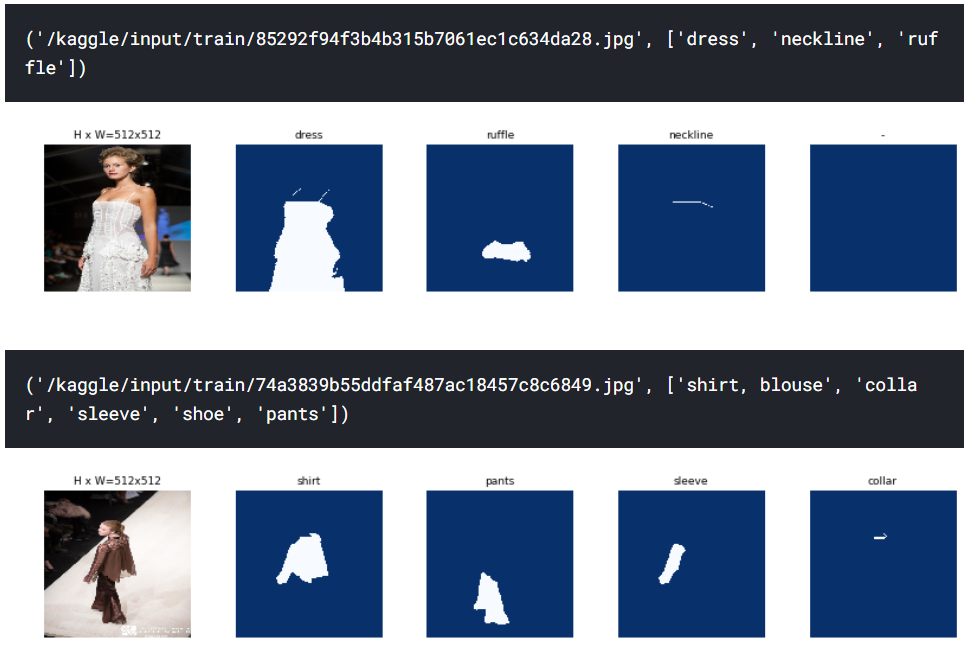

In [ ]:
# This code partially supports k-fold training, 
# you can specify the fold to train and the total number of folds here
FOLD = 0
N_FOLDS = 5

kf = KFold(n_splits=N_FOLDS, random_state=42, shuffle=True)
splits = kf.split(image_df) # ideally, this should be multilabel stratification

def get_fold():    
    for i, (train_index, valid_index) in enumerate(splits):
        if i == FOLD:
            return image_df.iloc[train_index], image_df.iloc[valid_index]
        
train_df, valid_df = get_fold()

train_dataset = FashionDataset(train_df)
train_dataset.prepare()

valid_dataset = FashionDataset(valid_df)
valid_dataset.prepare()

In [ ]:
train_segments = np.concatenate(train_df['CategoryId'].values).astype(int)
print("Total train images: ", len(train_df))
print("Total train segments: ", len(train_segments))

plt.figure(figsize=(12, 3))
values, counts = np.unique(train_segments, return_counts=True)
plt.bar(values, counts)
plt.xticks(values, label_names, rotation='vertical')
plt.show()

valid_segments = np.concatenate(valid_df['CategoryId'].values).astype(int)
print("Total train images: ", len(valid_df))
print("Total validation segments: ", len(valid_segments))

plt.figure(figsize=(12, 3))
values, counts = np.unique(valid_segments, return_counts=True)
plt.bar(values, counts)
plt.xticks(values, label_names, rotation='vertical')
plt.show()

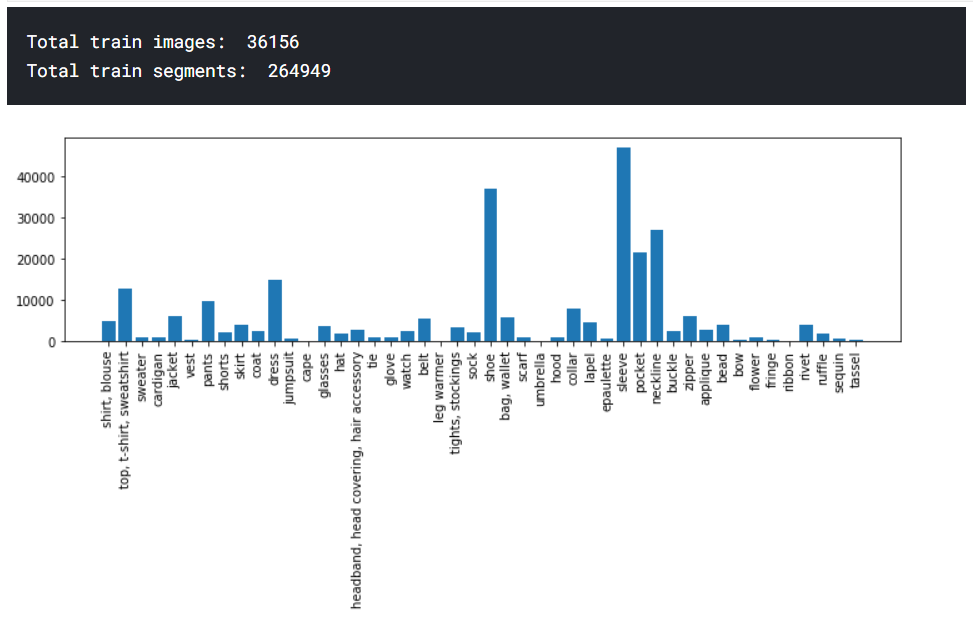

Train Model

In [ ]:
!wget https://storage.googleapis.com/cs2_myntra_bucket/mask_rcnn_fashion_0007.h5
COCO_WEIGHTS_PATH = 'mask_rcnn_fashion_0007.h5'

In [ ]:
# Note that any hyperparameters here, such as LR, may still not be optimal
LR = 1e-4
EPOCHS = [2, 6, 8]

import warnings 
warnings.filterwarnings("ignore")

In [ ]:
model = modellib.MaskRCNN(mode='training', config=config, model_dir=ROOT_DIR)

model.load_weights(COCO_WEIGHTS_PATH, by_name=True, exclude=[
    'mrcnn_class_logits', 'mrcnn_bbox_fc', 'mrcnn_bbox', 'mrcnn_mask'])

In [ ]:
augmentation = iaa.Sequential([
    iaa.Fliplr(0.5) # only horizontal flip here
])

In [ ]:
%%time
model.train(train_dataset, valid_dataset,
            learning_rate=LR*3, # train heads with higher lr to speedup learning
            epochs=EPOCHS[0],
            layers='heads',
            augmentation=None)

history = model.keras_model.history.history

In [ ]:
%%time
model.train(train_dataset, valid_dataset,
            learning_rate=LR,
            epochs=EPOCHS[1],
            layers='all',
            augmentation=augmentation)

new_history = model.keras_model.history.history
for k in new_history: history[k] = history[k] + new_history[k]

In [ ]:
%%time
model.train(train_dataset, valid_dataset,
            learning_rate=LR/5,
            epochs=EPOCHS[2],
            layers='all',
            augmentation=augmentation)

new_history = model.keras_model.history.history
for k in new_history: history[k] = history[k] + new_history[k]

In [ ]:
epochs = range(EPOCHS[-1])

plt.figure(figsize=(18, 6))

plt.subplot(131)
plt.plot(epochs, history['loss'], label="train loss")
plt.plot(epochs, history['val_loss'], label="valid loss")
plt.legend()
plt.subplot(132)
plt.plot(epochs, history['mrcnn_class_loss'], label="train class loss")
plt.plot(epochs, history['val_mrcnn_class_loss'], label="valid class loss")
plt.legend()
plt.subplot(133)
plt.plot(epochs, history['mrcnn_mask_loss'], label="train mask loss")
plt.plot(epochs, history['val_mrcnn_mask_loss'], label="valid mask loss")
plt.legend()

plt.show()

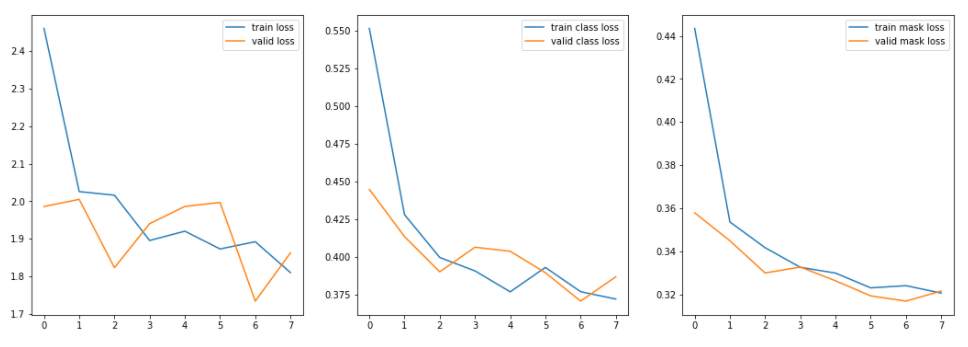

Test the model (Predict)

In [ ]:
# We should be able to directly predict using saved model so I am again importing all modules

!pip install tensorflow==1.9.0
!pip install keras==2.2.0

In [2]:
import os
import gc
import sys
import json
import glob
import random
from pathlib import Path

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import itertools
from tqdm import tqdm

from imgaug import augmenters as iaa
from sklearn.model_selection import StratifiedKFold, KFold

In [3]:
# For demonstration purpose, the classification ignores attributes (only categories),
# and the image size is set to 512, which is the same as the size of submission masks
NUM_CATS = 46
IMAGE_SIZE = 512

In [16]:
!git clone https://www.github.com/matterport/Mask_RCNN.git
os.chdir('Mask_RCNN')

!rm -rf .git # to prevent an error when the kernel is committed
!rm -rf images assets # to prevent displaying images at the bottom of a kernel

#copy saved model that is trained in above steps
!cp '/content/drive/MyDrive/AAIC/CS2/models/mask_rcnn_fashion_0006.h5' '/content/Mask_RCNN'
!cp '/content/drive/MyDrive/AAIC/CS2/models/label_descriptions.json' '/content/' 


Cloning into 'Mask_RCNN'...
remote: Enumerating objects: 956, done.
remote: Total 956 (delta 0), reused 0 (delta 0), pack-reused 956
Receiving objects: 100% (956/956), 125.23 MiB | 37.71 MiB/s, done.
Resolving deltas: 100% (560/560), done.


In [5]:
# Root directory of the project
ROOT_DIR = os.getcwd()

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library

custom_WEIGHTS_PATH = '/content/Mask_RCNN/mask_rcnn_fashion_0006.h5'

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

In [6]:
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or 

In [7]:
class FashionConfig(Config):
    NAME = "fashion"
    NUM_CLASSES = NUM_CATS + 1 # +1 for the background class
    
    GPU_COUNT = 1
    IMAGES_PER_GPU = 4 # a memory error occurs when IMAGES_PER_GPU is too high
    
    BACKBONE = 'resnet50'
    
    IMAGE_MIN_DIM = IMAGE_SIZE
    IMAGE_MAX_DIM = IMAGE_SIZE    
    IMAGE_RESIZE_MODE = 'none'
    
    RPN_ANCHOR_SCALES = (16, 32, 64, 128, 256)
    #DETECTION_NMS_THRESHOLD = 0.0
    
    # STEPS_PER_EPOCH should be the number of instances 
    # divided by (GPU_COUNT*IMAGES_PER_GPU), and so should VALIDATION_STEPS;
    # however, due to the time limit, I set them so that this kernel can be run in 9 hours
    STEPS_PER_EPOCH = 1000
    VALIDATION_STEPS = 200
    
config = FashionConfig()
config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     4
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 4
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                59
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              none
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE                

In [8]:
class InferenceConfig(FashionConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

model = modellib.MaskRCNN(mode='inference', 
                          config=inference_config,
                          model_dir=ROOT_DIR)

model_path ='/content/Mask_RCNN/mask_rcnn_fashion_0006.h5'
assert model_path != '', "Provide path to trained weights"


print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)#load trained model

Loading weights from  /content/Mask_RCNN/mask_rcnn_fashion_0006.h5


In [9]:
os.listdir('/content/')

['.config',
 'Mask_RCNN',
 'image8_3.jpg',
 'drive',
 'image7_4.jpg',
 'image4_3.jpg',
 'image5_3.jpg',
 'image3_3.jpg',
 'label_descriptions.json',
 'sample_data']

In [10]:
li =[ 'image8_3.jpg', 'image7_4.jpg',
 'image4_3.jpg',
 'image5_3.jpg',
 'image3_3.jpg']

image8_3.jpg


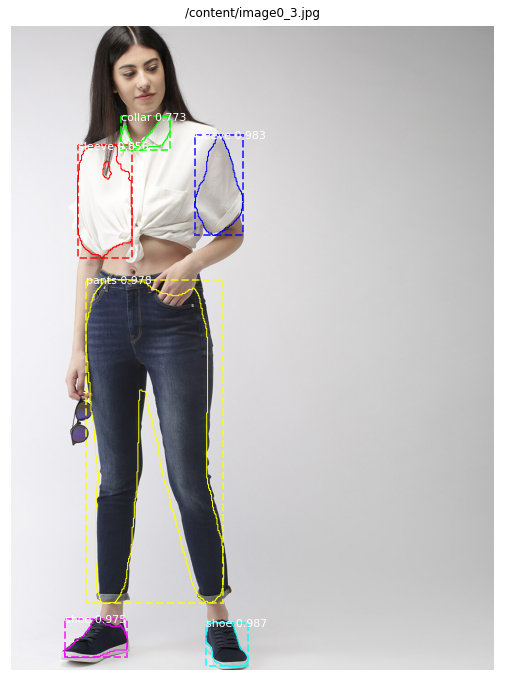

image7_4.jpg


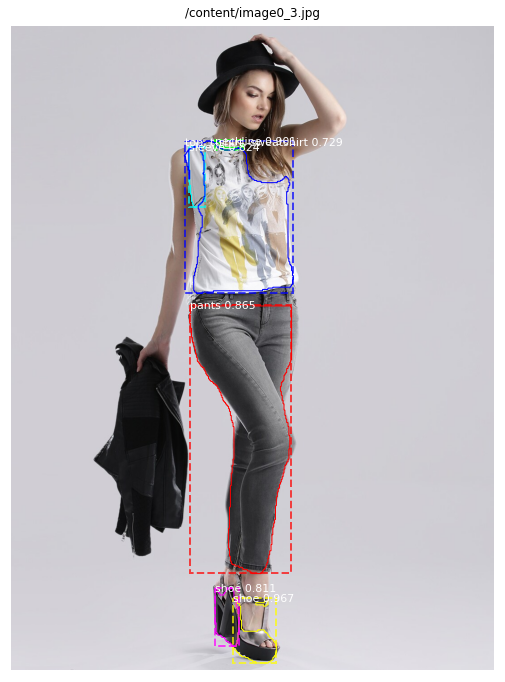

image4_3.jpg


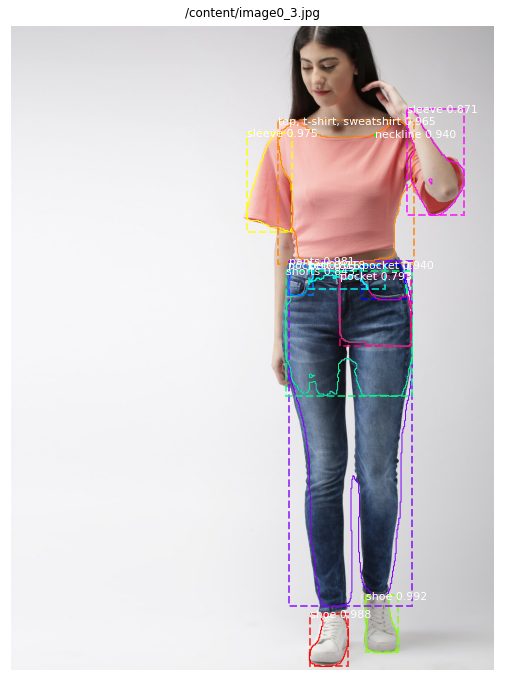

image5_3.jpg


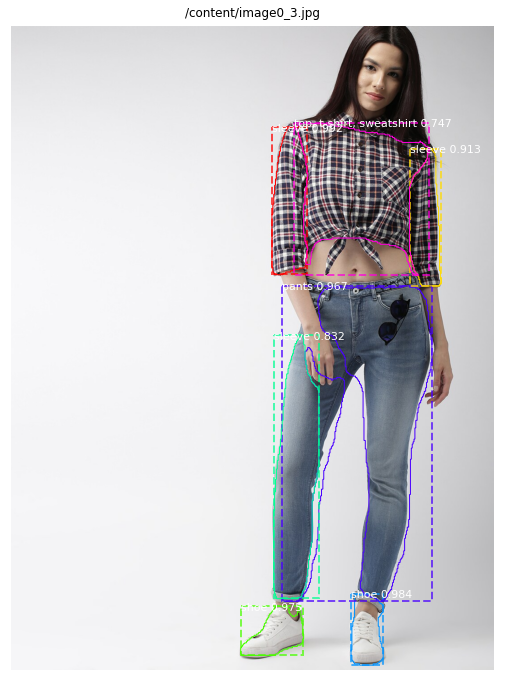

image3_3.jpg


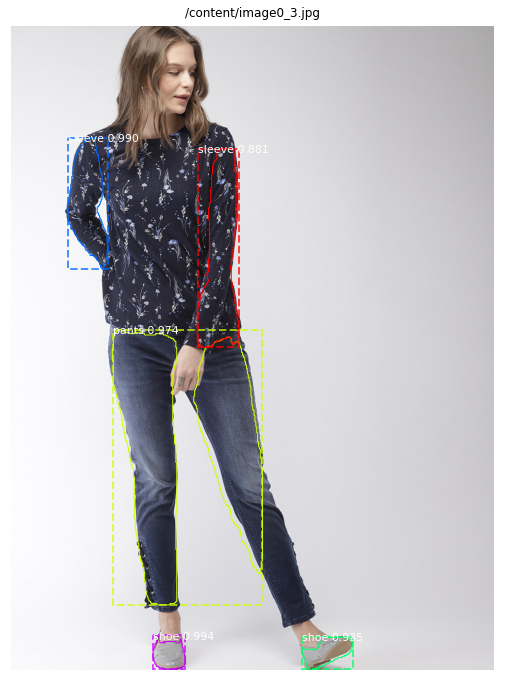

In [12]:
def resize_image(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE), interpolation=cv2.INTER_AREA)  
    return img

# Since the submission system does not permit overlapped masks, we have to fix them
def refine_masks(masks, rois):
    areas = np.sum(masks.reshape(-1, masks.shape[-1]), axis=0)
    mask_index = np.argsort(areas)
    union_mask = np.zeros(masks.shape[:-1], dtype=bool)
    for m in mask_index:
        masks[:, :, m] = np.logical_and(masks[:, :, m], np.logical_not(union_mask))
        union_mask = np.logical_or(masks[:, :, m], union_mask)
    for m in range(masks.shape[-1]):
        mask_pos = np.where(masks[:, :, m]==True)
        if np.any(mask_pos):
            y1, x1 = np.min(mask_pos, axis=1)
            y2, x2 = np.max(mask_pos, axis=1)
            rois[m, :] = [y1, x1, y2, x2]
    return masks, rois

with open('/content/label_descriptions.json') as f:
    label_descriptions = json.load(f)

label_names = [x['name'] for x in label_descriptions['categories']]  
for i in li:
    print(i)
    image_id = '/content/image0_3.jpg'
    image_path = '/content/' +i
    
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    result = model.detect([resize_image(image_path)])
    r = result[0]
    
    if r['masks'].size > 0:
        masks = np.zeros((img.shape[0], img.shape[1], r['masks'].shape[-1]), dtype=np.uint8)
        for m in range(r['masks'].shape[-1]):
            masks[:, :, m] = cv2.resize(r['masks'][:, :, m].astype('uint8'), 
                                        (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)
        
        y_scale = img.shape[0]/IMAGE_SIZE
        x_scale = img.shape[1]/IMAGE_SIZE
        rois = (r['rois'] * [y_scale, x_scale, y_scale, x_scale]).astype(int)
        
        masks, rois = refine_masks(masks, rois)
    else:
        masks, rois = r['masks'], r['rois']
        
    visualize.display_instances(img, rois, masks, r['class_ids'], 
                                ['bg']+label_names, r['scores'],
                                title=image_id, figsize=(12, 12),show_mask=False)

In [ ]:
"""
We can see Mask RCNN is performing well on our dataset so we will finalize this model
"""

Now we combine various category of clothes and pass crop images to module 3

In [14]:
import os
import sys
import random
import itertools
import colorsys

import numpy as np
from skimage.measure import find_contours
import matplotlib.pyplot as plt
from matplotlib import patches,  lines
from matplotlib.patches import Polygon
import IPython.display

from mrcnn import utils


In [13]:
#combine categories for simplification
feet = ['shoe']
upperbody = ['cardigan',
 'collar',
 'epaulette',
 'hood',
 'jacket',
 'lapel',
 'neckline',
 'shirt, blouse',
 'sleeve',
 'sweater',
 'top, t-shirt, sweatshirt',
 'vest']

lowerbody = ['pants', 'pocket', 'shorts', 'skirt']
wholebody = ['cape', 'coat', 'dress', 'jumpsuit']

In [15]:
def resize_image(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE), interpolation=cv2.INTER_AREA)  
    return img


def refine_masks(masks, rois):
    areas = np.sum(masks.reshape(-1, masks.shape[-1]), axis=0)
    mask_index = np.argsort(areas)
    union_mask = np.zeros(masks.shape[:-1], dtype=bool)
    for m in mask_index:
        masks[:, :, m] = np.logical_and(masks[:, :, m], np.logical_not(union_mask))
        union_mask = np.logical_or(masks[:, :, m], union_mask)
    for m in range(masks.shape[-1]):
        mask_pos = np.where(masks[:, :, m]==True)
        if np.any(mask_pos):
            y1, x1 = np.min(mask_pos, axis=1)
            y2, x2 = np.max(mask_pos, axis=1)
            rois[m, :] = [y1, x1, y2, x2]
    return masks, rois

with open('/content/label_descriptions.json') as f:
    label_descriptions = json.load(f)

label_names = [x['name'] for x in label_descriptions['categories']]  

In [17]:

def get_box(path):

  image_path = path
  img = cv2.imread(image_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  result = model.detect([resize_image(image_path)])
  r = result[0]

  if r['masks'].size > 0:
      masks = np.zeros((img.shape[0], img.shape[1], r['masks'].shape[-1]), dtype=np.uint8)
      for m in range(r['masks'].shape[-1]):
          masks[:, :, m] = cv2.resize(r['masks'][:, :, m].astype('uint8'), 
                                      (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)
      
      y_scale = img.shape[0]/IMAGE_SIZE
      x_scale = img.shape[1]/IMAGE_SIZE
      rois = (r['rois'] * [y_scale, x_scale, y_scale, x_scale]).astype(int)
      
      masks, rois = refine_masks(masks, rois)
      return img, masks, rois, r
  else:
      masks, rois = r['masks'], r['rois']
      return img,masks, rois, r
   


In [19]:

#here we will get boxes for our combined category

def get_parts(image, boxes, masks, class_ids, class_names,
                      scores=None, title="",
                      figsize=(16, 16), ax=None,
                      show_mask=True, show_bbox=True,
                      colors=None, captions=None):
    """
    boxes: [num_instance, (y1, x1, y2, x2, class_id)] in image coordinates.
    masks: [height, width, num_instances]
    class_ids: [num_instances]
    class_names: list of class names of the dataset
    scores: (optional) confidence scores for each box
    title: (optional) Figure title
    show_mask, show_bbox: To show masks and bounding boxes or not
    figsize: (optional) the size of the image
    colors: (optional) An array or colors to use with each object
    captions: (optional) A list of strings to use as captions for each object
    """
    # Number of instances
    N = boxes.shape[0]
    if not N:
        print("\n*** No instances to display *** \n")
    else:
        assert boxes.shape[0] == masks.shape[-1] == class_ids.shape[0]

    # Show area outside image boundaries.
    height, width = image.shape[:2]
    masked_image = image.astype(np.uint32).copy()

    feet_temp = []
    upperbody_temp = []
    lowerbody_temp = []
    wholebody_temp = []

    for i in range(N):
        # Bounding box
        if not np.any(boxes[i]):
            # Skip this instance. Has no bbox. Likely lost in image cropping.
            continue
        y1, x1, y2, x2 = boxes[i]
        # Label
        if not captions:
            class_id = class_ids[i]
            score = scores[i] if scores is not None else None
            label = class_names[class_id]
            caption = "{} {:.3f}".format(label, score) if score else label
            # print(f'class id: {class_id}, score: {score}, lable: {label},caption:{caption}')
            # print(y1, x1, y2, x2)
            if score>0.70:
              if label in feet:
                feet_temp.append((y1, x1, y2, x2))
              if label in upperbody:
                upperbody_temp.append((y1, x1, y2, x2))
              if label in lowerbody:
                lowerbody_temp.append((y1, x1, y2, x2))
              if label in wholebody:
                wholebody_temp.append((y1, x1, y2, x2))
        else:
            caption = captions[i]
    
    return  feet_temp ,upperbody_temp,lowerbody_temp , wholebody_temp



In [20]:
#get only objects from the boxes
def crop(y1,x1,y2,x2,img):
  outimage = img[int(y1):int(y2), int(x1):int(x2)]
  return outimage

def get_min_max(li,no,typee):
  mini = []
  for i in li:
    mini.append(i[no])
  if typee=='min': 
    return min(mini)
  if typee=='max':
    return max(mini)

def get_crop_image(img,li,name):
  #n = len(li)
  images = []
  if name=='feet':
    for i in li:
      outimage = crop(i[0],i[1],i[2],i[3],img)
      images.append(outimage)
  if name=='full':
    for i in li:
      outimage = crop(i[0],i[1],i[2],i[3],img)
      images.append(outimage)
  if name=='upp':
    y1 = get_min_max(li,0,'min')
    x1 = get_min_max(li,1,'min')
    y2 = get_min_max(li,2,'max')
    x2 = get_min_max(li,3,'max')
    outimage = crop(y1,x1,y2,x2,img)
    images.append(outimage)

  if name=='bott':
    y1 = get_min_max(li,0,'min')
    x1 = get_min_max(li,1,'min')
    y2 = get_min_max(li,2,'max')
    x2 = get_min_max(li,3,'max')
    outimage = crop(y1,x1,y2,x2,img)
    images.append(outimage)
  return images

In [21]:
def object_detctions(path):
  img , masks, rois, r = get_box(path)
  feet_temp ,upperbody_temp,lowerbody_temp , wholebody_temp = get_parts(img, rois, masks, r['class_ids'], 
                              ['bg']+label_names, r['scores'],
                              title=path, figsize=(12, 12),show_mask=False)
  feet_images = []
  whole_images = []
  upperbody_images = []
  lowerbody_images = []
  if len(feet_temp)>0:
    feet_images = get_crop_image(img,feet_temp,'feet')
  if len(wholebody_temp)>0:
    whole_images = get_crop_image(img,wholebody_temp,'full')
  if len(upperbody_temp)>0:
    upperbody_images = get_crop_image(img,upperbody_temp,'upp')
  if len(lowerbody_temp)>0:
    lowerbody_images = get_crop_image(img,lowerbody_temp,'bott')
  
  return img , masks, rois, r , feet_images, whole_images, upperbody_images, lowerbody_images


In [22]:
path = '/content/image4_3.jpg'
img , masks, rois, r , feet_images,whole_images,upperbody_images,lowerbody_images = object_detctions(path)

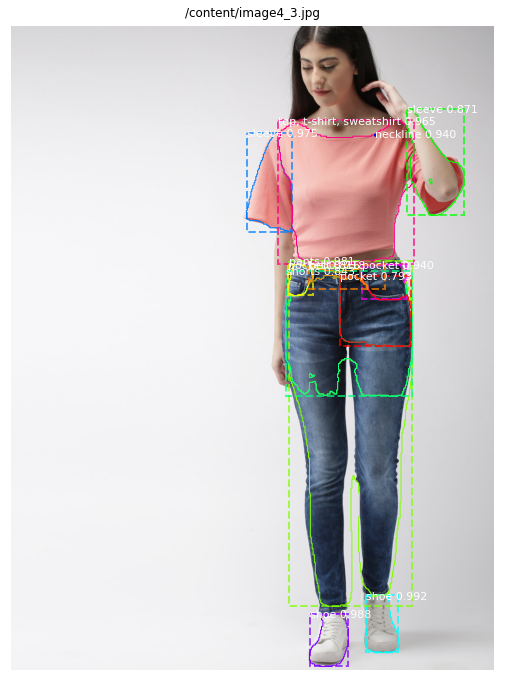

In [23]:
visualize.display_instances(img, rois, masks, r['class_ids'], 
                            ['bg']+label_names, r['scores'],
                            title=path, figsize=(12, 12),show_mask=False)

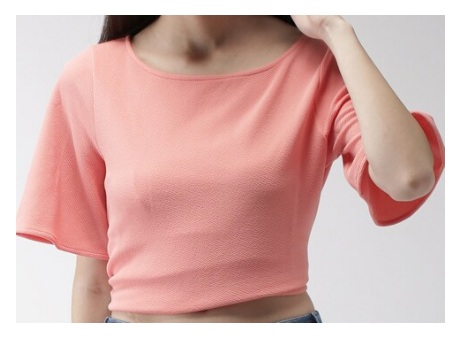

In [24]:
#crop samples that we will pass to embedding module for searching samples
for i in upperbody_images:
  outimage = i
  _, ax = plt.subplots(1, figsize=(8,8))
  auto_show = True

  height, width = outimage.shape[:2]
  ax.set_ylim(height + 10, -10)
  ax.set_xlim(-10, width + 10)
  ax.axis('off')
  img1 = outimage.astype(np.uint32).copy()
  ax.imshow(img1.astype(np.uint8))
  plt.show()

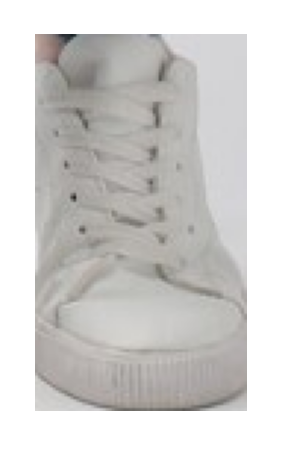

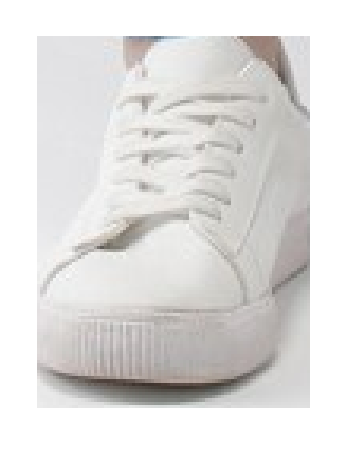

In [25]:
for i in feet_images:
  outimage = i
  _, ax = plt.subplots(1, figsize=(8,8))
  auto_show = True

  height, width = outimage.shape[:2]
  ax.set_ylim(height + 10, -10)
  ax.set_xlim(-10, width + 10)
  ax.axis('off')
  img1 = outimage.astype(np.uint32).copy()
  ax.imshow(img1.astype(np.uint8))
  plt.show()

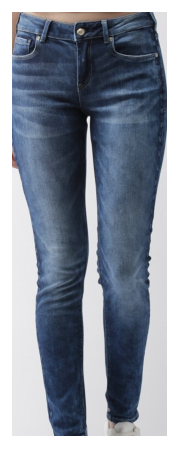

In [26]:
for i in lowerbody_images:
  outimage = i
  _, ax = plt.subplots(1, figsize=(8,8))
  auto_show = True

  height, width = outimage.shape[:2]
  ax.set_ylim(height + 10, -10)
  ax.set_xlim(-10, width + 10)
  ax.axis('off')
  img1 = outimage.astype(np.uint32).copy()
  ax.imshow(img1.astype(np.uint8))
  plt.show()

In [ ]:
"""
This crop images will be passed to module 3 to convert them to embeddings
"""